This notebook generates a heat-map with the centers of the bounding boxes

In [1]:
import json
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import os
plt.rcParams.update({'font.size': 16})

In [8]:
INSTAN_PATH_VAL = "../TRAN2LYavg/data/datasets/COCO/annotations/instances_train2014.json"
NUMBER_OF_SECTORS = 16

In [9]:
if not os.path.exists("./heat-map"):
    os.mkdir("./heat-map")

In [10]:
with open(INSTAN_PATH_VAL, "r") as json_file:
    coco = json.load(json_file)

In [11]:
image_id_to_size = {}
for object_data in coco['images']:
    image_id = str(object_data['id'])
    image_id_to_size[image_id] = (object_data['width'], object_data['height'])

In [12]:
objects = {}
for object_data in coco['annotations']:
    image_id = str(object_data['image_id'])
    bbox = object_data['bbox']
    WW, HH = image_id_to_size[image_id]
    bbox[0], bbox[1], bbox[2], bbox[3] = bbox[0] / WW, bbox[1] / HH, (bbox[0] + bbox[2]) / WW, (bbox[1] + bbox[3]) / HH
    # Centers
    bbox[0], bbox[1] = (bbox[0] + bbox[2]) * 0.5, (bbox[1] + bbox[3]) * 0.5
    if object_data['category_id'] in objects:
        objects[object_data['category_id']].append(bbox)
    else:
        objects[object_data['category_id']] = [bbox]

In [13]:
category_to_name = {}
for object_data in coco['categories']:
    category_to_name[object_data['id']] = object_data['name']

In [14]:
print(objects[2])

[[0.4882207207207207, 0.6419375, 0.9454504504504504, 0.832265625], [0.11862500000000001, 0.15275, 0.16448437500000002, 0.19412500000000002], [0.3986640625, 0.7537644341801386, 0.7333125, 0.9870900692840646], [0.6492974238875878, 0.8749609374999999, 0.7203044496487119, 0.9163124999999999], [0.2599765625, 0.7891745283018867, 0.355375, 0.9817924528301886], [0.7415859375, 0.4444551282051282, 0.75584375, 0.4667628205128205], [0.06782812499999999, 0.45711111111111113, 0.128421875, 0.5080666666666667], [0.20707291666666666, 0.8915234375000001, 0.2687291666666667, 0.9434687500000001], [0.8102812500000001, 0.6160025706940874, 0.890609375, 0.6830077120822622], [0.2522109375, 0.5278393351800554, 0.297625, 0.6879501385041551], [0.45134722222222223, 0.571265625, 0.8421666666666667, 0.763375], [0.061156249999999995, 0.7853020833333333, 0.120703125, 0.9891666666666665], [0.4433437499999999, 0.7387222222222223, 0.48507812499999997, 0.8645277777777778], [0.6791484375000001, 0.6488229166666667, 0.843156

In [15]:
class HeatMap():
    def __init__(self, number_of_categories, number_of_sectors, category_to_name):
        self.number_of_categories = number_of_categories
        self.number_of_sectors = number_of_sectors
        self.category_to_name = category_to_name
        self.number_of_objects_in_category = {}
        self.heat_maps = {}
        
        for i in range(number_of_categories):
            self.heat_maps[i] = np.array([[0]*(self.number_of_sectors) for i in range(self.number_of_sectors)])
    
    def print_heat_map(self, category_id):
        for i in self.heat_maps[category_id]:
            print(i)
    
    def add_element(self, category_id, x, y):
        # Lets suppose that x, y are in range [0, 1]
        x = x * self.number_of_sectors
        y = y * self.number_of_sectors
        pos_x = int(x) 
        pos_y = int(y)
        
        if pos_x == self.number_of_sectors:
            pos_x -= 1
        if pos_y == self.number_of_sectors:
            pos_y -= 1
            
        self.heat_maps[category_id][pos_y][pos_x] += 1
        if category_id in self.number_of_objects_in_category:
            self.number_of_objects_in_category[category_id] += 1
        else:
            self.number_of_objects_in_category[category_id] = 1
    
    def show_heat_map(self, category_id):
        axis = np.arange(0, 1, 1/(self.number_of_sectors))
        
        h_m = self.heat_maps[category_id]
        
        fig, ax = plt.subplots(figsize=(15,15), )
        # self.print_heat_map(category_id)
        im = ax.imshow(h_m, cmap = 'Greens')
        cbar = ax.figure.colorbar(im, ax=ax)
        cbar.ax.set_ylabel("Number of elements", rotation=-90, va="bottom")
        
        ax.set_xticks(np.arange(len(axis)))
        ax.set_yticks(np.arange(len(axis)))
        
        ax.set_xticklabels(axis)
        ax.set_yticklabels(axis)
        
        plt.setp(ax.get_xticklabels(), rotation=45, ha="right", rotation_mode="anchor")
        
        for i in range(len(axis)):
            for j in range(len(axis)):
                text = ax.text(j, i, h_m[i, j],
                    ha="center", va="center", color="k")
        
        ax.set_title(self.category_to_name[category_id])
        fig.tight_layout()
        fig.savefig("./heat-map/" + str(category_id) + '.png', dpi=fig.dpi)
        plt.show()

In [16]:
def add_category_to_heat_map(heat_map, objects, category_id):
    for bbox in objects[category_id]:
        heat_map.add_element(category_id, bbox[0], bbox[1])
    

In [17]:
# create the heat map
heat_map = HeatMap(100, NUMBER_OF_SECTORS, category_to_name)

In [18]:
# add all the categories
for key in objects.keys():
    add_category_to_heat_map(heat_map, objects, key)

In [19]:
# kite x, y 
for bbox in objects[38]:
    print(bbox[0], bbox[1])

0.22249999999999998 0.11887500000000001
0.7111015624999999 0.5415962441314555
0.8749140625 0.4247243107769424
0.7945093457943926 0.2144609375
0.83994 0.6818799999999999
0.298390625 0.32855971896955505
0.4355854800936768 0.07230468749999999
0.6278854166666666 0.734
0.5407031250000001 0.5325352112676056
0.8559687500000001 0.28551562500000005
0.5522578125000001 0.32460187353629977
0.5043203125 0.38205208333333335
0.11182189542483661 0.20383169934640522
0.38595833333333335 0.14471874999999998
0.5499336283185841 0.5699375
0.663546875 0.19166666666666665
0.4024590163934426 0.47773437500000004
0.641671875 0.699875
0.44834375 0.6963646288209607
0.5403515624999999 0.5716953125
0.8085100000000001 0.47656156156156154
0.3293208430913349 0.0512578125
0.48231 0.52732
0.49787499999999996 0.14110416666666664
0.43128125000000006 0.06545774647887323
0.7335624999999999 0.47730468750000005
0.5187916666666667 0.18295312500000002
0.5123645833333335 0.665171875
0.8971944444444445 0.26585156249999997
0.14143 

0.42504687500000005 0.23279166666666667
0.5255156249999999 0.15116666666666667
0.638765625 0.21628805620608899
0.6289218750000001 0.6249479166666667
0.4037265625 0.6595058823529412
0.5174375 0.27837500000000004
0.3337109375 0.1558470588235294
0.254578125 0.3051666666666667
0.819225 0.52877
0.1350234375 0.6614270833333333
0.4156015625 0.14443914081145584
0.45425 0.3178125
0.7998046875 0.18508333333333332
0.24897916666666664 0.391546875
0.46692187500000004 0.5269086651053865
0.28966042154566746 0.2576171875
0.38860000000000006 0.11848
0.329375 0.9262141491395792
0.8512187499999999 0.5817638888888889
0.130109375 0.2432373271889401
0.71265625 0.3247065727699531
0.48164843749999997 0.4910163551401868
0.3726796875 0.10850230414746544
0.6253437500000001 0.12369020501138953
0.8124921875 0.1149264705882353
0.8808515625 0.15664319248826292
0.6381796875 0.5238125
0.8722578125 0.2370833333333333
0.8135546874999999 0.198384074941452
0.97319 0.4773866666666666
0.6863025210084034 0.2731015625
0.28675

0.06949999999999999 0.051812500000000004
0.4277109375 0.886070496083551
0.2616484375 0.29292253521126765
0.34067187499999996 0.6672334004024145
0.1586015625 0.5510514018691588
0.78784 0.6710400000000001
0.6039765625 0.4677146814404432
0.37528 0.4284684684684685
0.59025 0.08762762762762763
0.24060156249999998 0.13056206088992975
0.21028528528528528 0.66811
0.1304765625 0.81125
0.8381147540983607 0.6554921874999999
0.18674999999999997 0.6932933333333333
0.1359037558685446 0.777671875
0.1608046875 0.31964871194379385
0.8501145833333333 0.779765625
0.776046875 0.4544145199063232
0.222015625 0.3863967136150235
0.5075078125 0.4021979166666667
0.8410703125000001 0.4588823529411764
0.5810625 0.35658333333333336
0.34523 0.43146268656716413
0.42644531250000006 0.49584375
0.47382 0.20941333333333334
0.58278125 0.15666276346604216
0.024609375 0.10841121495327102
0.6301953124999999 0.14298958333333334
0.793953125 0.47424218749999997
0.4397734375 0.6738359375
0.5288984375 0.44284037558685446
0.17049

0.389765625 0.32419791666666664
0.41646651270207846 0.27716406250000003
0.9138671875 0.8748463356973996
0.35213000000000005 0.2918168168168168
0.45307812499999994 0.3349612403100775
0.50123 0.623390243902439
0.6030703125 0.35358333333333325
0.2642109375 0.3438317757009346
0.9060625 0.4421666666666667
0.45974218749999995 0.7546370023419203
0.5700624999999999 0.59290625
0.34401 0.8182634730538922
0.7115703124999999 0.4503464203233256
0.18364 0.5128666666666666
0.33225000000000005 0.48448958333333336
0.7136640624999999 0.5721311475409836
0.28529333333333334 0.72858
0.7194895833333333 0.6611015625000001
0.57383 0.6684000000000001
0.9745877659574468 0.58139
0.6241299999999999 0.2222666666666667
0.041898437499999996 0.097294921875
0.9951000000000001 0.39080000000000004
0.43294531249999996 0.6256145833333333
0.4084757505773672 0.297859375
0.37420312499999997 0.48814553990610327
0.6258203124999999 0.6859507042253521
0.6496494845360825 0.1726640625
0.6626328125000001 0.5633541666666666
0.565288

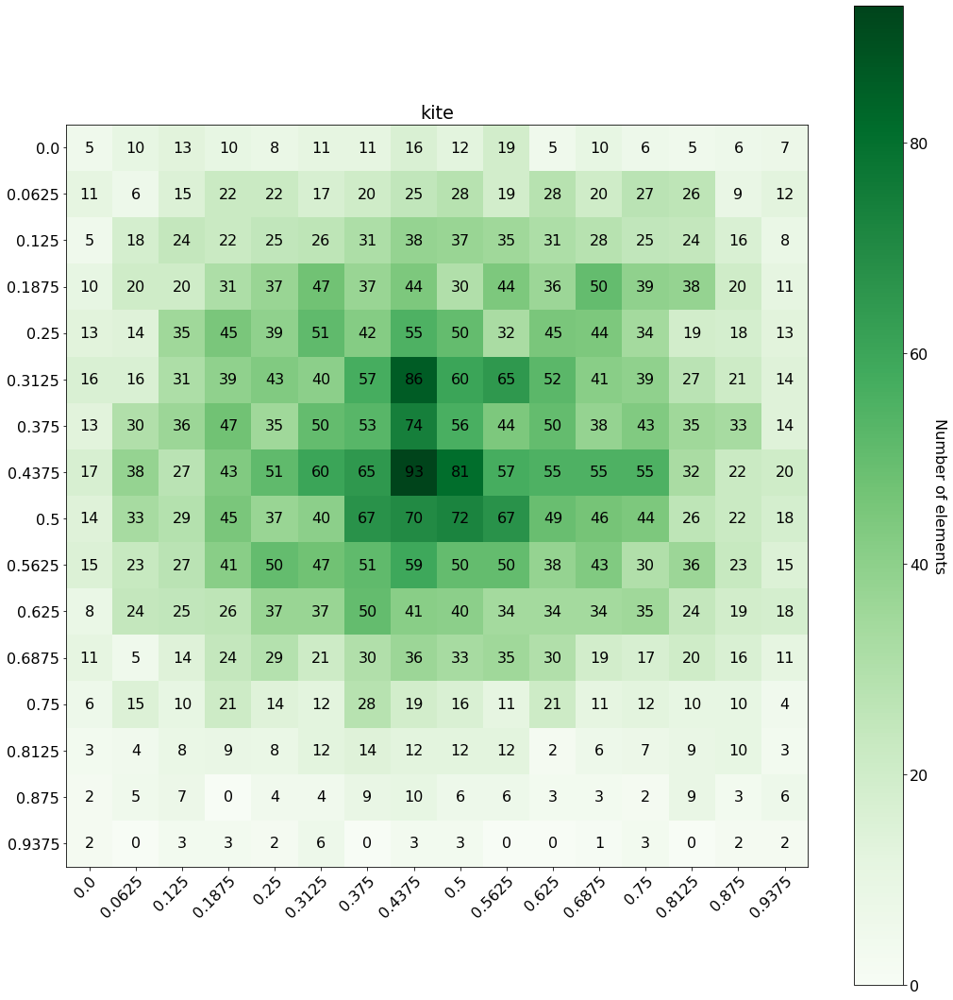

In [20]:
heat_map.show_heat_map(38)

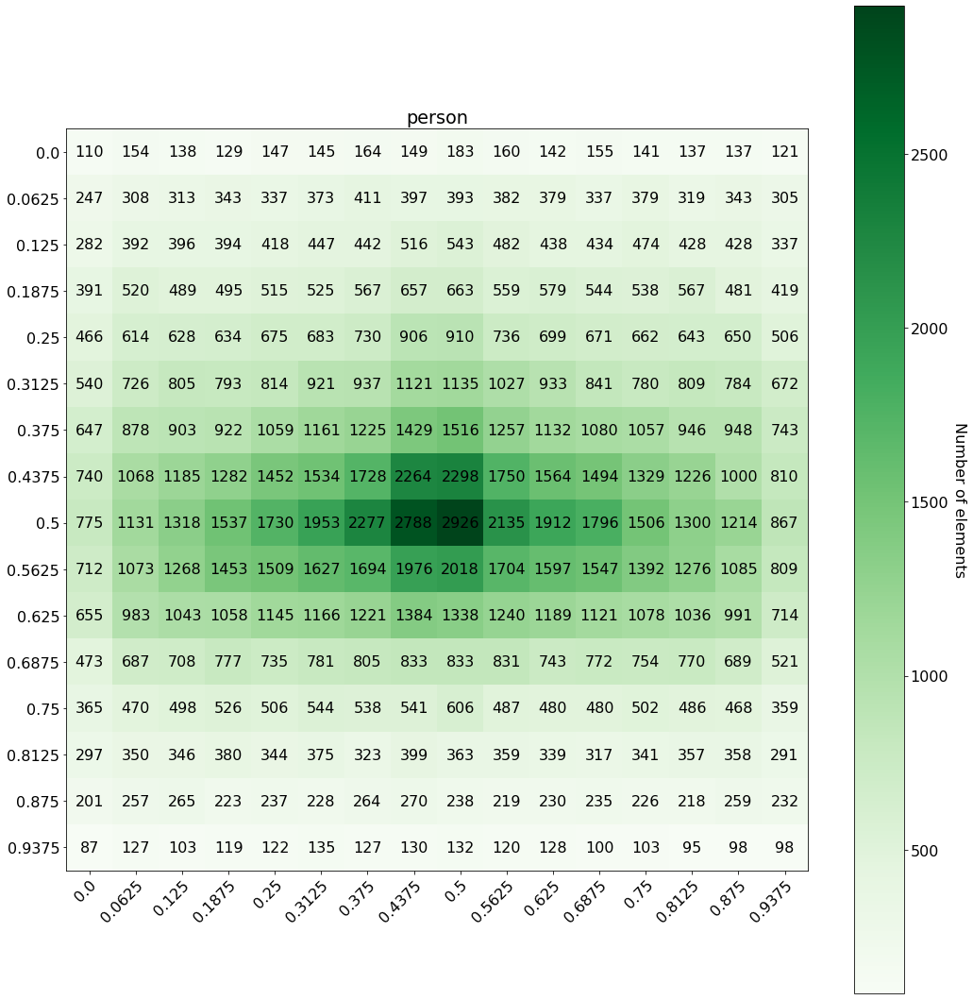

In [21]:
heat_map.show_heat_map(1)

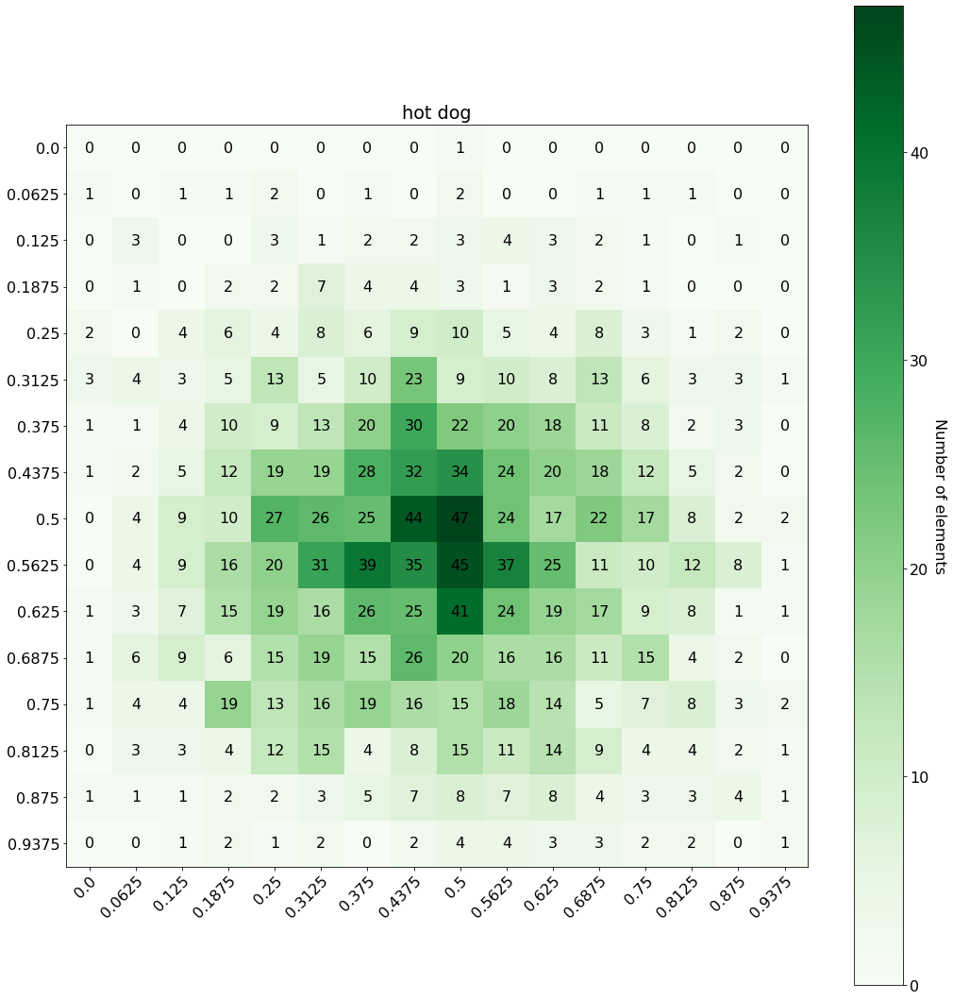

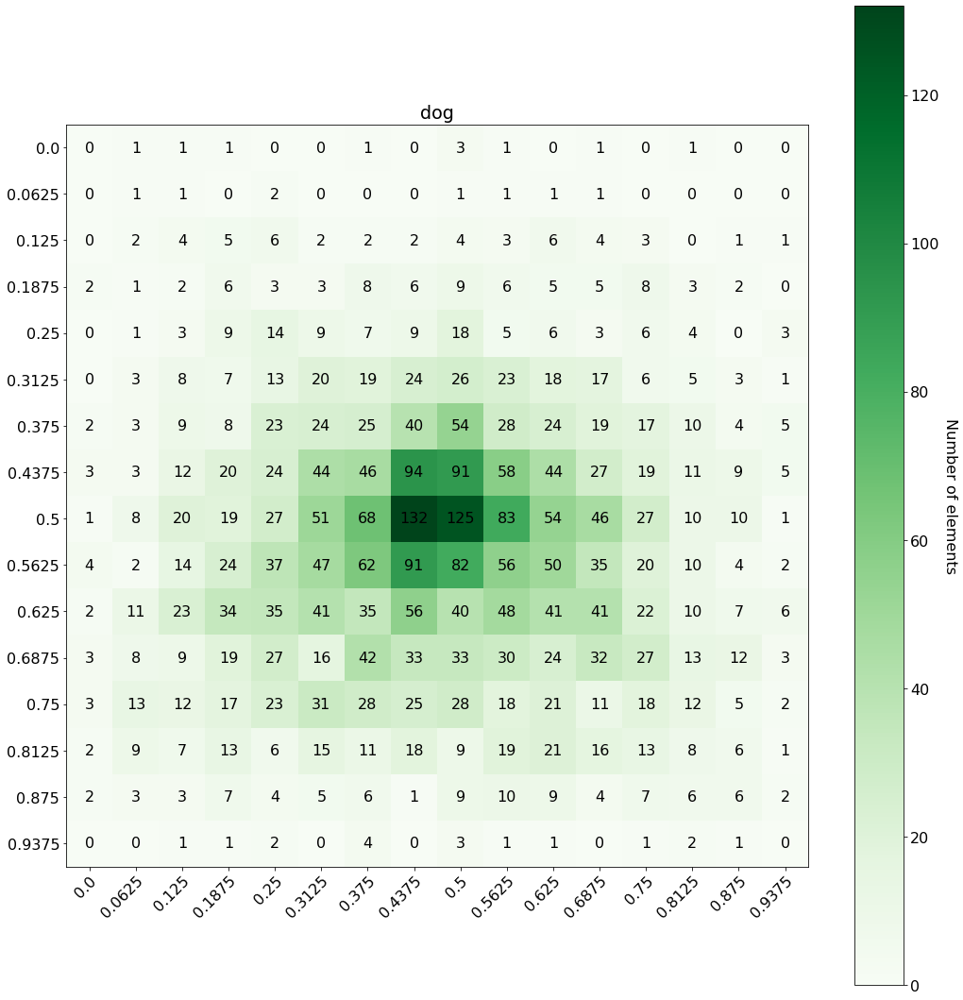

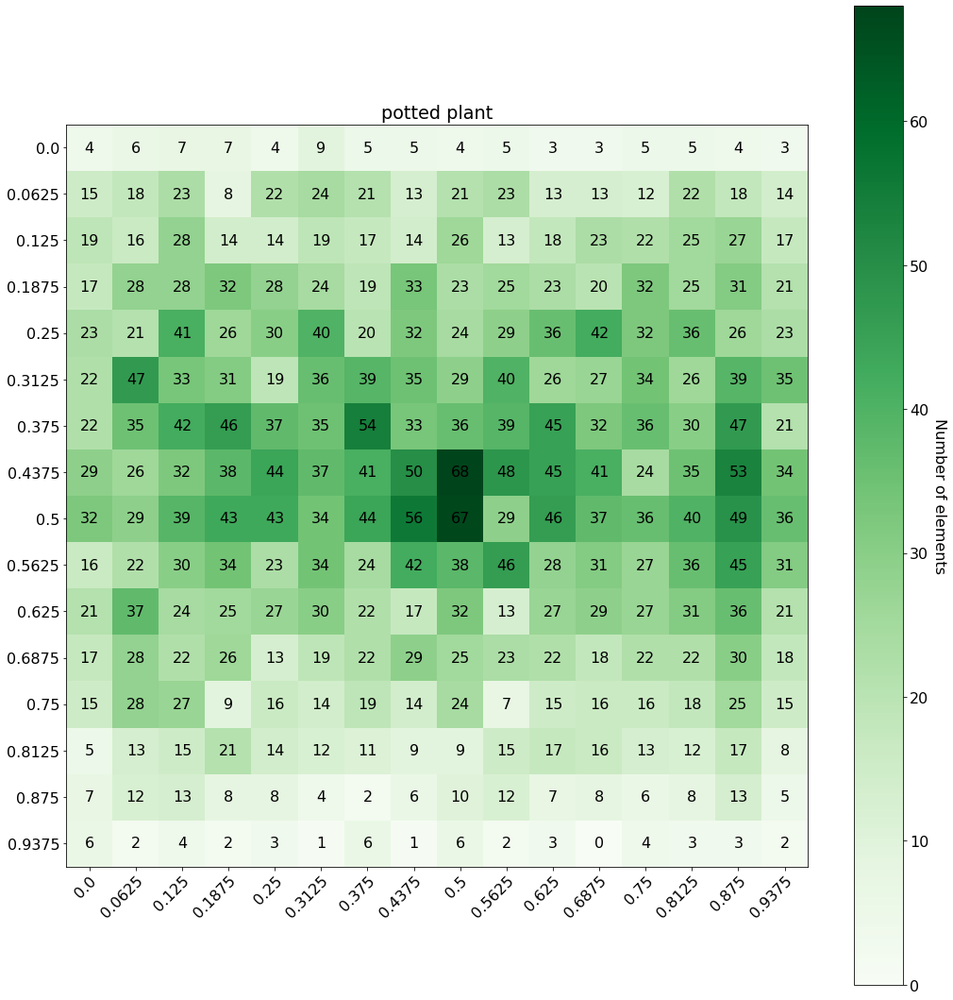

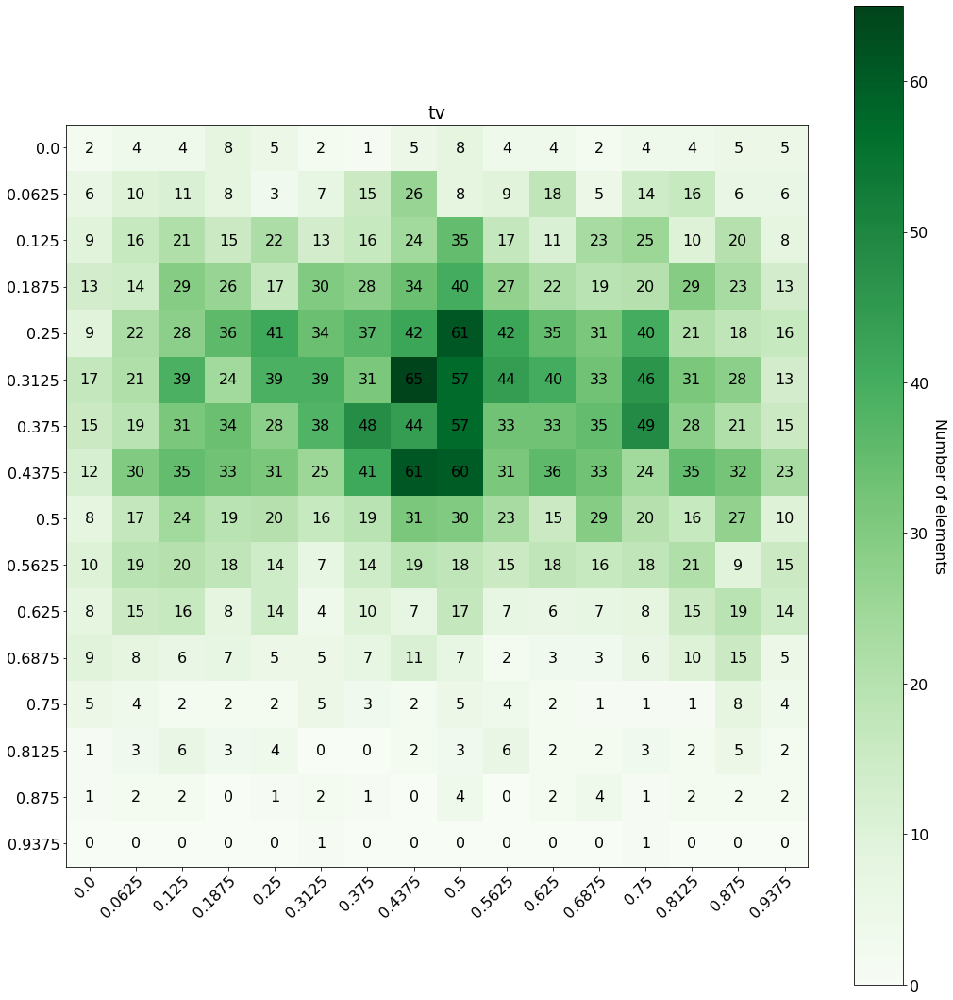

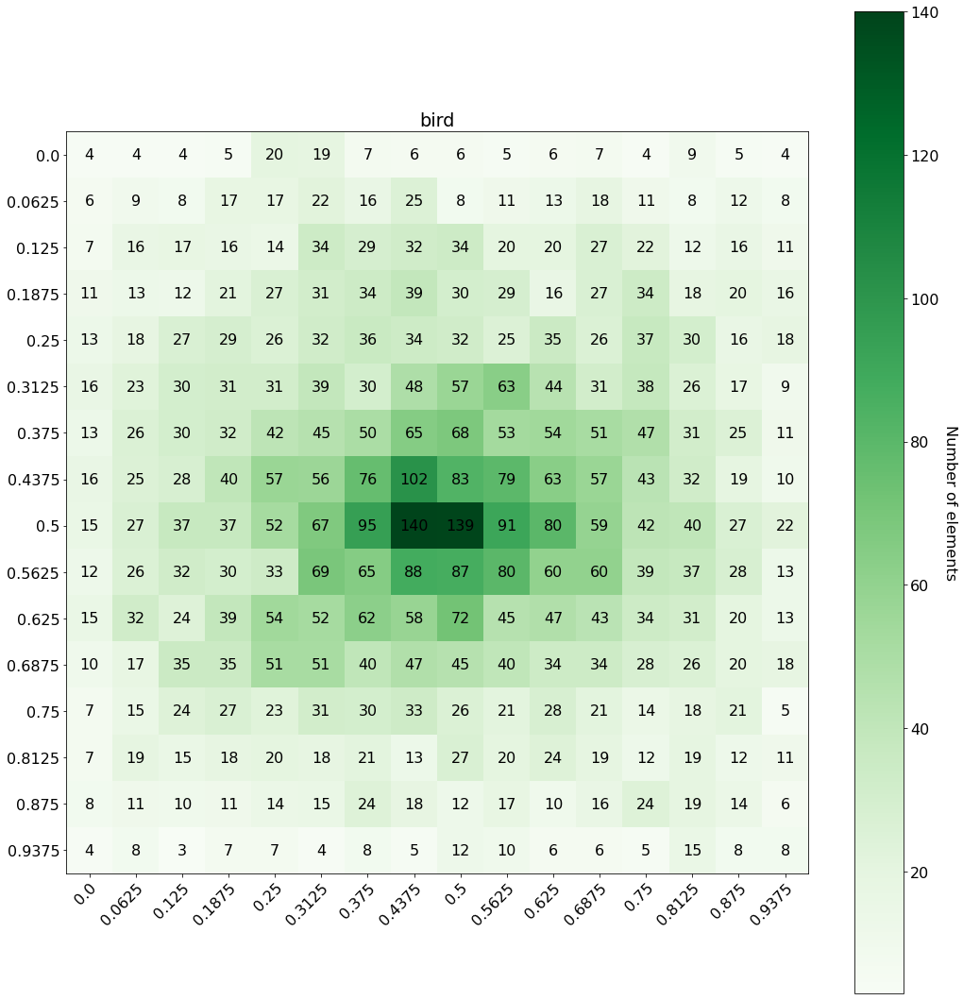

...

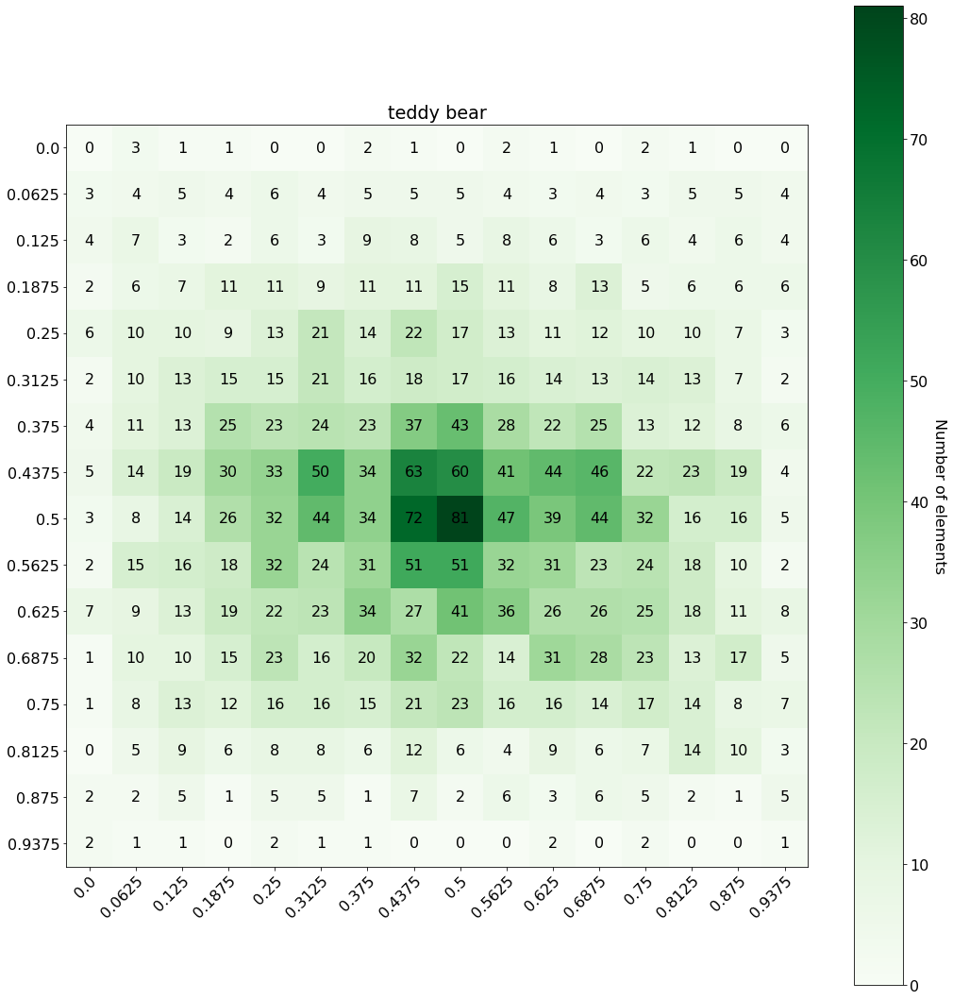

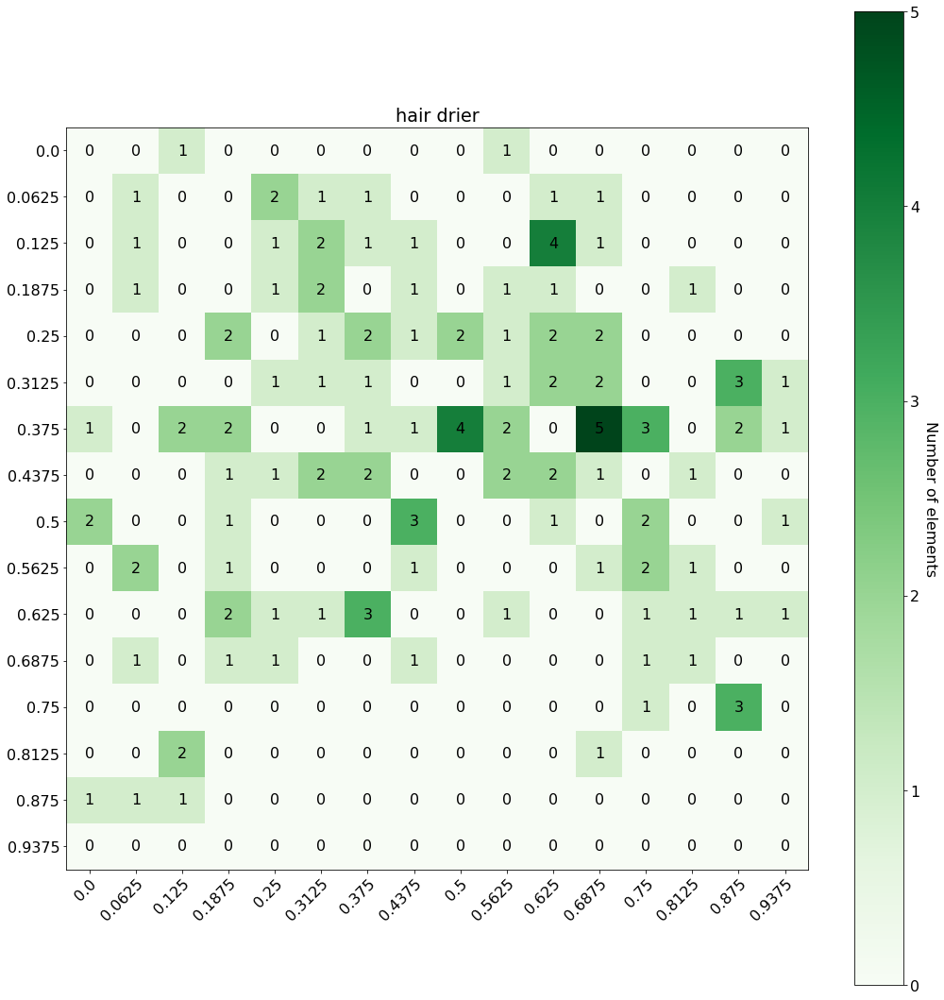

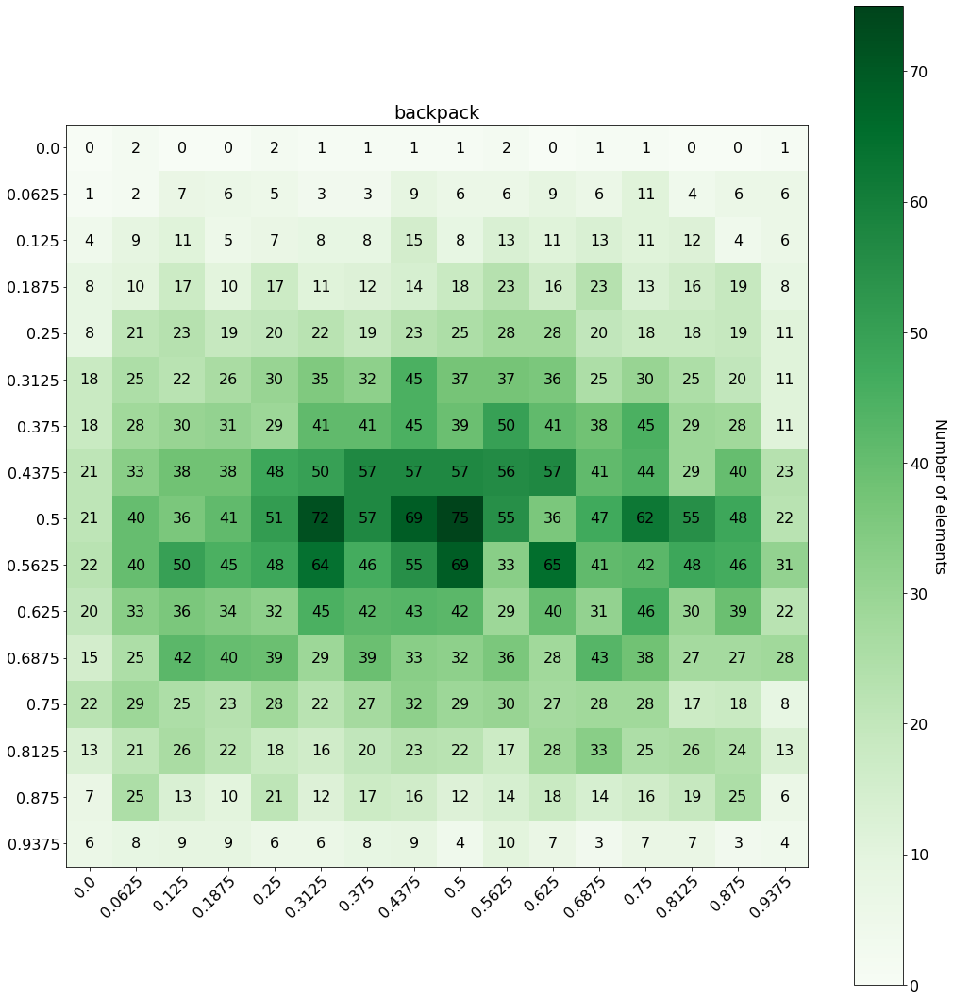

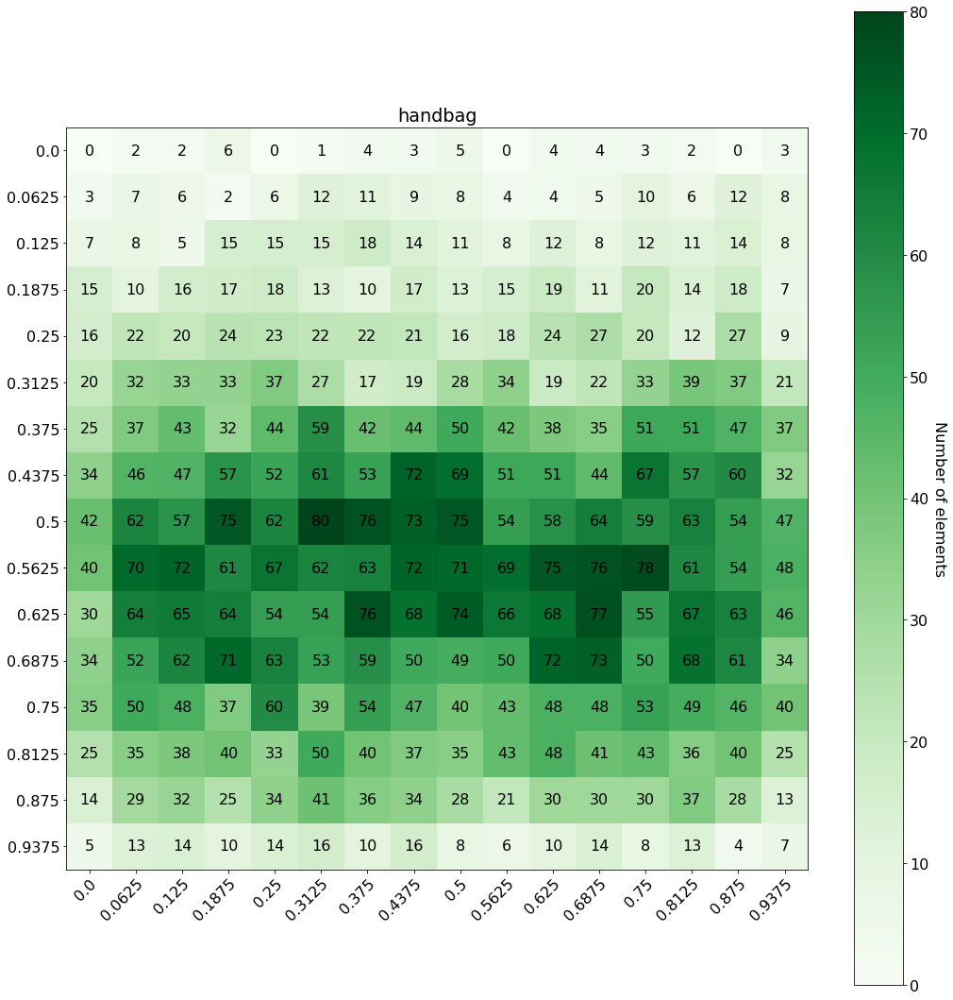

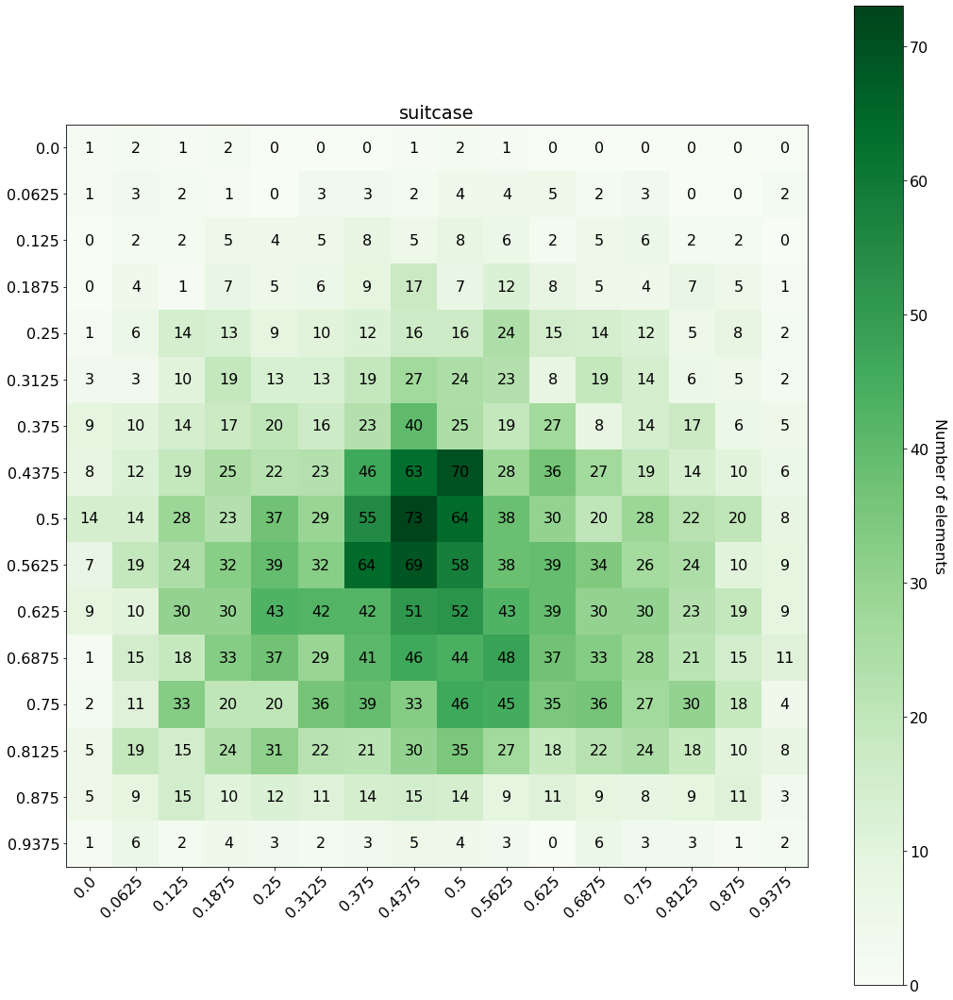

In [22]:
for key in objects.keys():
    heat_map.show_heat_map(key)

Generate a gif with all the outputs

In [23]:
import imageio
import glob
images = []
filenames = list(glob.glob("./heat-map/*"))

ModuleNotFoundError: No module named 'imageio'

In [ ]:
print(filenames)
print(len(filenames))

In [ ]:
for filename in filenames:
    images.append(imageio.imread(filename))
imageio.mimsave('./class_heat-map.gif', images)